In [1]:
import pandas as pd
import numpy as np
import os
import sys
from collections import Counter
import gget
import scipy

from Bio import SeqIO
from Bio.KEGG import REST
from Bio.KEGG.KGML import KGML_parser

import scanpy as sc
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

"""WARNING: disabling future warnings"""
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sys.path.append("../")
import utils as ut

In [2]:
# fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run1/scanpy/anndata.h5ad"
# fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run2/scanpy/anndata.h5ad"
# fpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC/scanpy/anndata.h5ad"
# fpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC_run3/scanpy/anndata.h5ad"
fpath = "/scratch/indikar_root/indikar1/cstansbu/HSC_p2/scanpy/anndata.h5ad"


adata = sc.read(fpath, cache=False)
adata.layers["counts"] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 8657 × 19393
    obs: 'n_genes'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand'
    layers: 'counts'

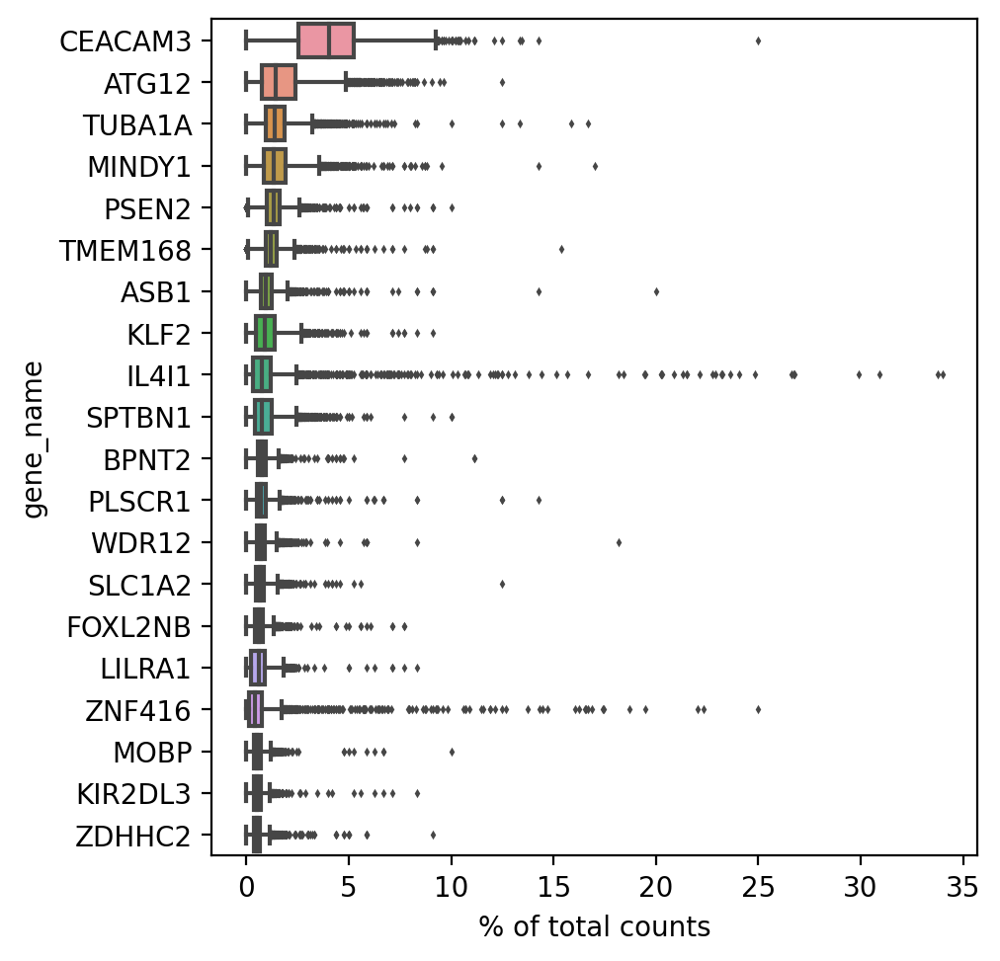

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.highest_expr_genes(adata, n_top=20, gene_symbols='gene_name')

In [4]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

adata

AnnData object with n_obs × n_vars = 8355 × 13807
    obs: 'n_genes'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand', 'n_cells'
    layers: 'counts'

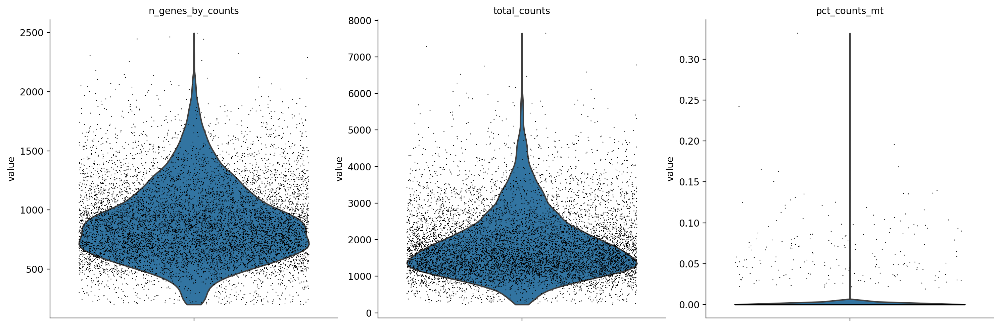

In [5]:
adata.var['mt'] = adata.var['gene_name'].str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=['mt'], 
                           percent_top=None,
                           log1p=False, 
                           inplace=True)

"""
A violin plot of some of the computed quality measures:

 - the number of genes expressed in the count matrix
 - the total counts per cell
 - the percentage of counts in mitochondrial genes
"""
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 2.5
sc.pl.violin(adata, 
             ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, 
             multi_panel=True)

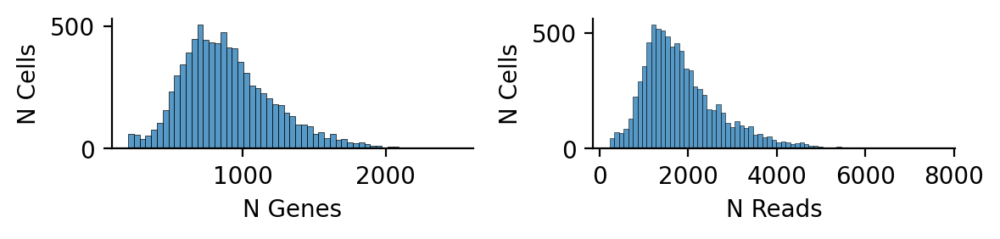

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 1.5

fig, axs = plt.subplots(1, 2)

sns.histplot(data=adata.obs,
             x='n_genes_by_counts',
             ax=axs[0])

axs[0].set_ylabel('N Cells')
axs[0].set_xlabel('N Genes')

sns.histplot(data=adata.obs,
             x='total_counts',
             ax=axs[1])

axs[1].set_ylabel('N Cells')
axs[1].set_xlabel('N Reads')

sns.despine()
plt.tight_layout()

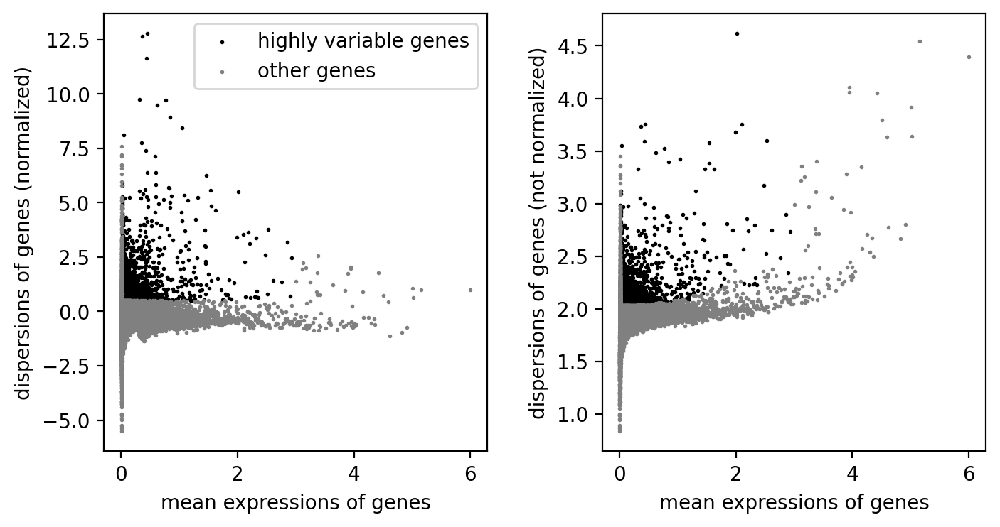

In [7]:
# preprocess
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.highly_variable_genes(adata)

In [8]:
""" 
run3: 693.524794388002
"""
adata.obs['n_genes'].mean()

897.6606822262119

In [9]:
""" 
run3: 1297.1390904692792
"""
adata.obs['total_counts'].mean()

1877.067145421903

In [45]:
adata.obs.head()

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,UMAP 1,UMAP 2,Fibroblast_mean,Fibroblast_max,Fibroblast_argmax,Fibroblast_highest_exp,HSC_mean,HSC_max,HSC_argmax,HSC_highest_exp,clusters
cell_id,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,863,863,1678,0,0.0,1.812136,0.085088,0.151356,4.283776,123,KLF2,0.090689,2.558695,7,CD34,0
AAACCCAAGTTGAAGT,841,841,1367,0,0.0,0.938766,-0.203422,0.222459,4.565376,34,FSTL1,0.119329,2.118096,17,FGD5,0
AAACCCAAGTTGTCGT,629,629,1156,0,0.0,6.635494,2.609273,0.129992,2.906958,95,C1S,0.095789,2.267012,21,GPR171,1
AAACCCACAGAAGCGT,580,580,902,0,0.0,9.789871,2.471889,0.090624,4.033043,123,KLF2,0.070200,2.492087,7,CD34,1
AAACCCACAGGAGGTT,1505,1504,3797,0,0.0,2.233023,2.535564,0.290326,4.907617,34,FSTL1,0.116712,1.835348,68,DNMT3B,0


In [10]:
# break

# Low dimensional embedding (PCA/UMAP)

2024-01-03 08:48:31.772957: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-03 08:48:42.213029: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-03 08:48:58.330470: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-01-03 08:48:58.330930: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such 

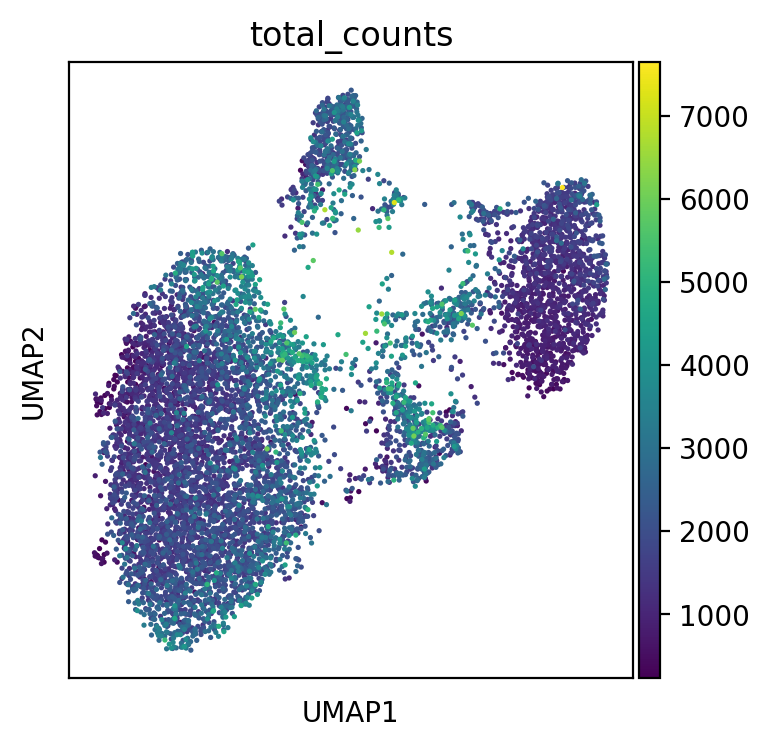

In [11]:
# mathematical processing
n_comps = 80
n_neighbors = 11
neighbors_n_pcs = 20
min_dist = 0.2
spread = 0.8

sc.tl.pca(adata, n_comps=n_comps, zero_center=True)
sc.pp.neighbors(adata, 
                n_neighbors=n_neighbors, 
                n_pcs=neighbors_n_pcs)

sc.tl.umap(adata, min_dist, spread)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4
sc.pl.umap(adata, color='total_counts')

# add these columns to obs
adata.obs['UMAP 1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP 2'] = adata.obsm['X_umap'][:,1]

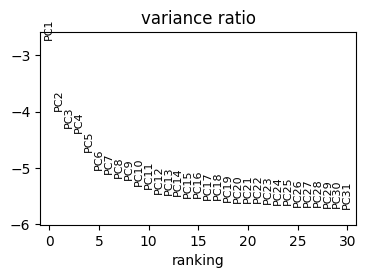

In [12]:
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = 4, 2.5
sc.pl.pca_variance_ratio(adata, log=True)


In [13]:
# # Eigen analysis
# X = adata.X
# A = np.corrcoef(X)
# print(f"{A.shape=}")

# u, s, vh = np.linalg.svd(A)

# plt.plot(s[:20], marker="o", c='k')
# plt.yscale("log")
# plt.ylabel('Magnitude (log)')
# plt.xlabel('Eigenvalue')
# plt.title(r'Leading Eigenvalues of $\mathbf{A}$')
# sns.despine()

# Marker genes

In [14]:
def getGenes(pdf, cellType, ui_upper=None):
    genes = pdf[pdf['cell type'] == cellType]
    
    if not ui_upper is None:
        genes = genes[genes['ubiquitousness index'] < ui_upper]
    return genes['official gene symbol'].to_list()


pdfPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"
pandDf = pd.read_csv(pdfPath, sep="\t")

fb = getGenes(pandDf, 'Fibroblasts')
hp = getGenes(pandDf, 'Hematopoietic stem cells')

print(f"FB genes: {len(fb)}")
print(f"HP genes: {len(hp)}")

print(Counter(fb + hp).most_common(5)) # there are three genes shared in both lists


marker_genes = {
    'Fibroblast' : adata.var[adata.var['gene_name'].isin(fb)].index,
    'HSC' : adata.var[adata.var['gene_name'].isin(hp)].index,
}

id2name = dict(zip(adata.var.index.values, adata.var['gene_name'].values))
name2id = dict(zip(adata.var['gene_name'].values, adata.var.index.values))

FB genes: 179
HP genes: 88
[('THY1', 2), ('CD44', 2), ('EGR1', 2), ('RUNX1', 2), ('IL1R1', 1)]


In [15]:
# make some observation columns
for k, v in marker_genes.items():
    print(k, v.shape)

    adata.obs[f"{k}_mean"] = adata[:, v].X.mean(axis=1).copy()
    adata.obs[f"{k}_max"] = adata[:, v].X.max(axis=1).copy()
    adata.obs[f"{k}_argmax"] = adata[:, v].X.argmax(axis=1).copy()
    adata.obs[f"{k}_highest_exp"] = adata.obs[f"{k}_argmax"].apply(lambda x : id2name[v[x]])

adata.obs.head()

Fibroblast (127,)
HSC (71,)


,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,UMAP 1,UMAP 2,Fibroblast_mean,Fibroblast_max,Fibroblast_argmax,Fibroblast_highest_exp,HSC_mean,HSC_max,HSC_argmax,HSC_highest_exp
cell_id,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,863,863,1678,0,0.0,1.812136,0.085088,0.151356,4.283776,123,KLF2,0.090689,2.558695,7,CD34
AAACCCAAGTTGAAGT,841,841,1367,0,0.0,0.938766,-0.203422,0.222459,4.565376,34,FSTL1,0.119329,2.118096,17,FGD5
AAACCCAAGTTGTCGT,629,629,1156,0,0.0,6.635494,2.609273,0.129992,2.906958,95,C1S,0.095789,2.267012,21,GPR171
AAACCCACAGAAGCGT,580,580,902,0,0.0,9.789871,2.471889,0.090624,4.033043,123,KLF2,0.070200,2.492087,7,CD34
AAACCCACAGGAGGTT,1505,1504,3797,0,0.0,2.233023,2.535564,0.290326,4.907617,34,FSTL1,0.116712,1.835348,68,DNMT3B


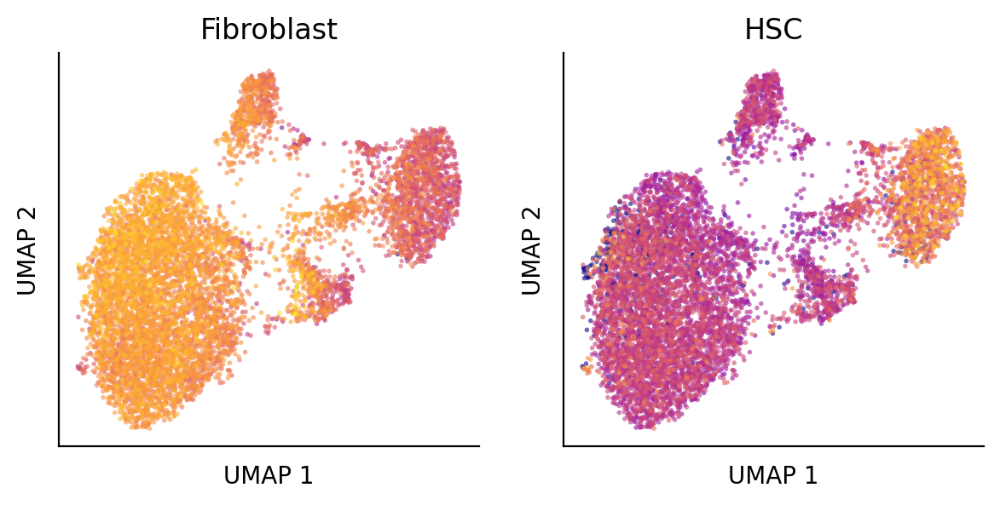

In [16]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 3

pdf = adata.obs.copy()
fig, axs = plt.subplots(1, 2)

cmap = 'plasma'
size = 4
alpha = 0.6

# sort order
order1 = np.argsort(pdf['Fibroblast_max'])
order2 = np.argsort(pdf['HSC_max'])


sns.scatterplot(data=pdf.iloc[order1], 
                x='UMAP 1',
                y='UMAP 2',
                hue='Fibroblast_max',
                palette=cmap,
                alpha=alpha,
                ax=axs[0],
                s=size,
                ec='none')

axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].legend().remove()
axs[0].set_title('Fibroblast')

sns.scatterplot(data=pdf.iloc[order2], 
                x='UMAP 1',
                y='UMAP 2',
                hue='HSC_max',
                palette=cmap,
                alpha=alpha,
                ax=axs[1],
                s=size,
                ec='none')

axs[1].set_yticks([])
axs[1].legend().remove()
axs[1].set_xticks([])
axs[1].set_title('HSC')

sns.despine()

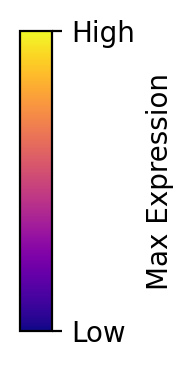

In [17]:
ut.makeColorbar('plasma', 0.2, 2.5, 'Max Expression', 'vertical', ['Low', 'High'])

In [18]:
# break

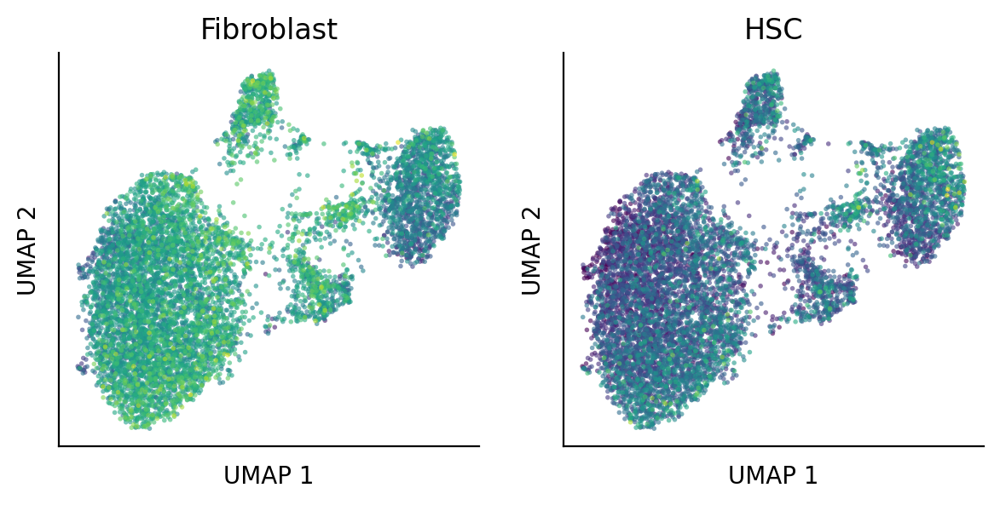

In [19]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 7, 3

pdf = adata.obs.copy()
fig, axs = plt.subplots(1, 2)

cmap = 'viridis'
size = 4
alpha = 0.6

# sort order
order1 = np.argsort(pdf['Fibroblast_mean'])
order2 = np.argsort(pdf['HSC_mean'])


sns.scatterplot(data=pdf.iloc[order1], 
                x='UMAP 1',
                y='UMAP 2',
                hue='Fibroblast_mean',
                palette=cmap,
                alpha=alpha,
                ax=axs[0],
                s=size,
                ec='none')

axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].legend().remove()
axs[0].set_title('Fibroblast')

sns.scatterplot(data=pdf.iloc[order2], 
                x='UMAP 1',
                y='UMAP 2',
                hue='HSC_mean',
                palette=cmap,
                alpha=alpha,
                ax=axs[1],
                s=size,
                ec='none')

axs[1].set_yticks([])
axs[1].legend().remove()
axs[1].set_xticks([])
axs[1].set_title('HSC')

sns.despine()

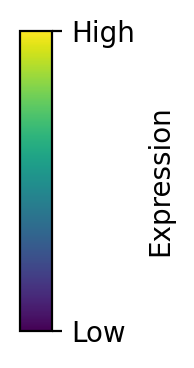

In [20]:
ut.makeColorbar('viridis', 0.2, 2.5, 'Expression', 'vertical', ['Low', 'High'])

In [21]:
# break

# Clustering

... storing 'Fibroblast_highest_exp' as categorical
... storing 'HSC_highest_exp' as categorical


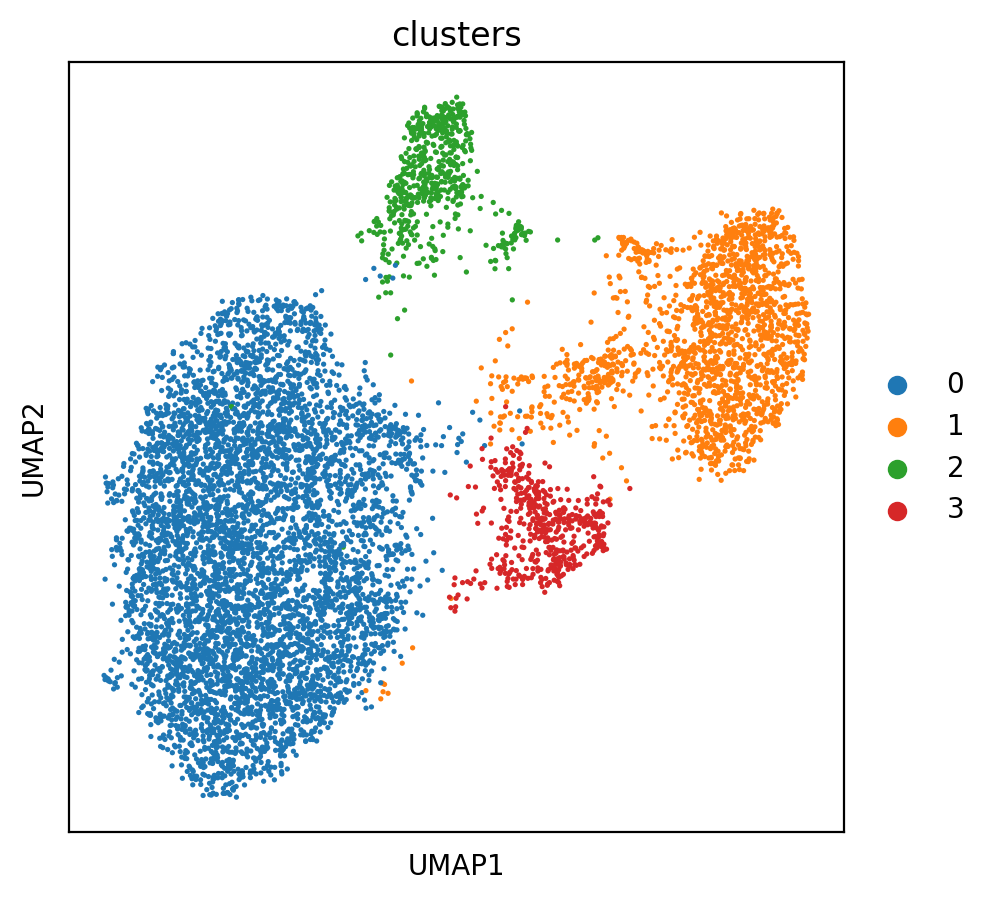

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,UMAP 1,UMAP 2,Fibroblast_mean,Fibroblast_max,Fibroblast_argmax,Fibroblast_highest_exp,HSC_mean,HSC_max,HSC_argmax,HSC_highest_exp,clusters
cell_id,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,863,863,1678,0,0.0,1.812136,0.085088,0.151356,4.283776,123,KLF2,0.090689,2.558695,7,CD34,0
AAACCCAAGTTGAAGT,841,841,1367,0,0.0,0.938766,-0.203422,0.222459,4.565376,34,FSTL1,0.119329,2.118096,17,FGD5,0
AAACCCAAGTTGTCGT,629,629,1156,0,0.0,6.635494,2.609273,0.129992,2.906958,95,C1S,0.095789,2.267012,21,GPR171,1
AAACCCACAGAAGCGT,580,580,902,0,0.0,9.789871,2.471889,0.090624,4.033043,123,KLF2,0.070200,2.492087,7,CD34,1
AAACCCACAGGAGGTT,1505,1504,3797,0,0.0,2.233023,2.535564,0.290326,4.907617,34,FSTL1,0.116712,1.835348,68,DNMT3B,0


In [22]:
# clustering 
resolution = 0.3
key = f"clusters"
sc.tl.leiden(adata, 
             resolution=resolution,
             key_added=key)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5
sc.pl.umap(adata, color=["clusters",])

adata.obs.head()

In [23]:
# break

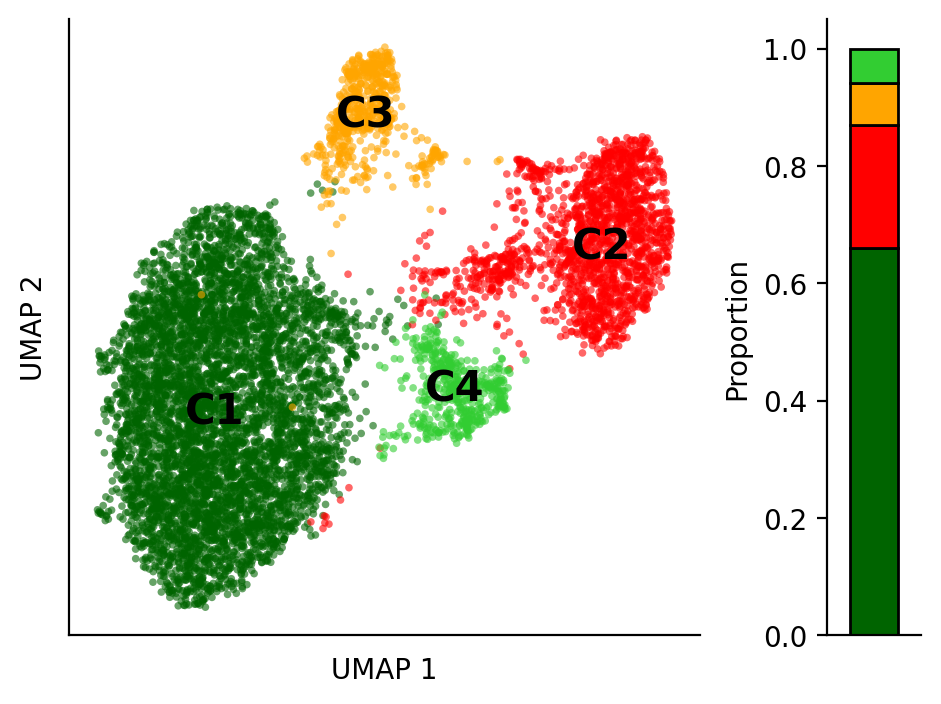

In [24]:
pdf = adata.obs.copy()
pdf['cluster_name'] = pdf['clusters'].astype(int).apply(lambda x: f"C{x+1}")
pdf = pdf.sort_values(by='cluster_name')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5.5, 4

colors = ['darkgreen', 'red', "orange", "limegreen"]
size = 7.5
alpha = 0.6

sns.scatterplot(data=pdf, 
                x='UMAP 1',
                y='UMAP 2',
                hue='cluster_name',
                palette=colors,
                alpha=alpha,
                s=size,
                ec='none')



plt.yticks([])
plt.xticks([])

# label on data
ax = plt.gca()

all_pos = (
        pdf.groupby('cluster_name')[['UMAP 1', 'UMAP 2']]
        .median()
        .sort_index()
    )

for label, x_pos, y_pos in all_pos.itertuples():
    ax.text(
        x_pos,
        y_pos,
        label,
        weight='bold',
        verticalalignment="center",
        horizontalalignment="center",
        fontsize='15',
    )

ax = plt.gca()
ax.legend().remove()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="15%")

t = adata.obs['clusters'].value_counts(normalize=True).reset_index(drop=False).T
new_header = t.iloc[0] 
t = t[1:]
t.columns = ['C1', 'C2', 'C3', 'C4']
t.plot(kind='bar', 
       stacked=True,
       legend=False,
       color=colors,
       ax=cax,
       ec='k')

cax.set_xlabel("")
cax.set_xticks([])
cax.set_ylabel("Proportion")

sns.despine()

In [25]:
print(sorted(fb))

['ABI3', 'ACKR3', 'ADAM33', 'ADAMTS10', 'ADAMTS5', 'ADGRE4', 'AKR1C18', 'ANGPTL2', 'ARAP1', 'ASPN', 'C1S', 'CCL11', 'CCL19', 'CCR2', 'CD209A', 'CD248', 'CD300E', 'CD40', 'CD44', 'CD55', 'CDH11', 'CEBPB', 'CELA1', 'CKAP4', 'CLEC3B', 'COL12A1', 'COL13A1', 'COL14A1', 'COL15A1', 'COL1A1', 'COL1A2', 'COL3A1', 'COL4A3', 'COL4A4', 'COL5A1', 'COL5A2', 'COL6A2', 'COL6A3', 'COL7A1', 'COL8A1', 'COPZ2', 'CTGF', 'CTHRC1', 'CTSK', 'CXCL14', 'CXCL3', 'CXCL8', 'CYP1B1', 'DCN', 'DDR2', 'DKK1', 'DKK3', 'DPEP1', 'DPT', 'EAR2', 'EDN3', 'EFEMP1', 'EGR1', 'ELN', 'EN1', 'ENO3', 'ENTPD2', 'ERCC1', 'FABP4', 'FAP', 'FBLN2', 'FBLN7', 'FBN1', 'FGF2', 'FGR', 'FIBIN', 'FKBP10', 'FKBP7', 'FLI1', 'FMO2', 'FN1', 'FOSB', 'FOSL2', 'FOXF1', 'FRZB', 'FSTL1', 'GJB2', 'GREM1', 'GSN', 'GSTM5', 'HAS1', 'HCK', 'HGF', 'HHIP', 'HIF1A', 'IGF1', 'IGFBP3', 'IGFBP6', 'IL1R1', 'IL34', 'IL6', 'INMT', 'ITGAL', 'ITIH5', 'KLF2', 'KLF4', 'KLF6', 'KLF9', 'LAMA2', 'LAMB1', 'LAMC1', 'LOX', 'LRRK1', 'LUM', 'LY6I', 'MDK', 'MEDAG', 'MEOX1', 'MF

CD55 ENSG00000196352
FSTL1 ENSG00000163430
CD34 ENSG00000174059
MGST1 ENSG00000008394


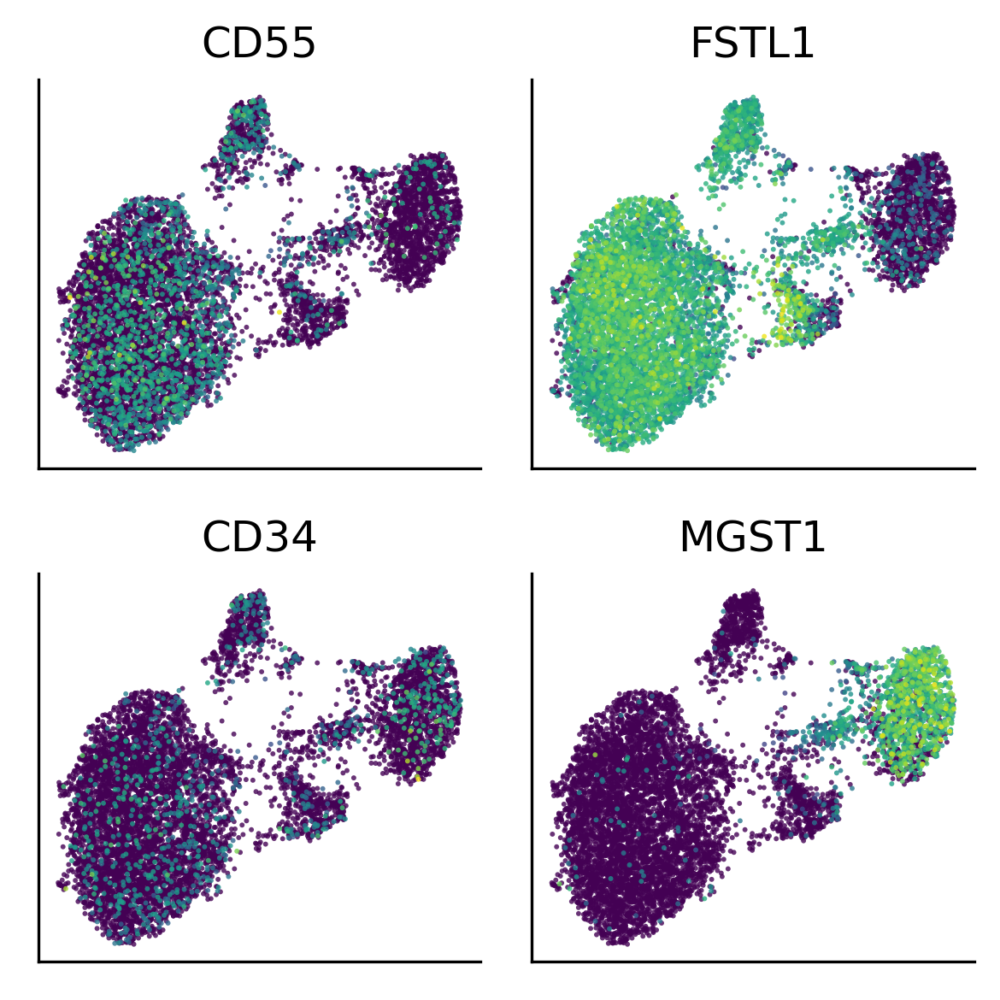

In [26]:
gene_list = [
    'CD55',
    'FSTL1',
    'CD34', 
    'MGST1', 
    
] # must be q square

n = len(gene_list)
pltn = int(np.sqrt(n))

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4
fig, axs = plt.subplots(pltn, pltn)
axs = axs.ravel()

for i, g in enumerate(gene_list):
    gene_name = adata.var[adata.var['gene_name'] == g].index[0]
    print(g, gene_name)
    v = adata[:, [gene_name]].X.copy()


    gdf = adata.obs.copy()
    gdf['exp'] = np.ravel(v)

    order = np.argsort(gdf['exp'])


    axs[i].scatter(gdf['UMAP 1'][order], 
                   gdf['UMAP 2'][order],
                   c=gdf['exp'][order],
                   s=2,
                   alpha=0.8,
                   ec='none')
    
    axs[i].set_title(g)

    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_xlabel("")
    axs[i].set_ylabel("")

sns.despine()
plt.tight_layout()

In [27]:
# break

# Highly expressed genes

In [28]:
res = []

for cluster in adata.obs['clusters'].unique():
    cdata = adata[adata.obs['clusters'] == cluster]
    cluster_name = f"C{int(cluster)+1}"

    gene_data = cdata.var.copy()

    gene_data['cluster'] = cluster_name
    gene_data['cluster_mean'] = np.ravel(cdata.X.mean(axis=0))
    gene_data['cluster_median'] = np.ravel(np.median(cdata.X, axis=0))
    gene_data['cluster_max'] = np.ravel(cdata.X.max(axis=0))

    gene_data['cluster_mean_rank'] = gene_data['cluster_mean'].rank(ascending=False)
    gene_data['cluster_median_rank'] = gene_data['cluster_median'].rank(ascending=False)
    gene_data['cluster_max_rank'] = gene_data['cluster_max'].rank(ascending=False)    

    res.append(gene_data)

res = pd.concat(res)
res.head()

,gene_name,Chromosome,Start,End,Strand,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,...,means,dispersions,dispersions_norm,cluster,cluster_mean,cluster_median,cluster_max,cluster_mean_rank,cluster_median_rank,cluster_max_rank
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000160072,ATAD3B,1,1471764,1497848,+,173,False,173,0.021065,97.929384,...,0.103255,1.833852,-0.501113,C1,0.030967,0.0,2.474973,7695.0,7055.0,10416.5
ENSG00000157933,SKI,1,2228318,2310213,+,664,False,664,0.085697,92.052663,...,0.371184,1.921452,-0.345701,C1,0.144253,0.0,3.381304,2773.0,7055.0,3949.0
ENSG00000142655,PEX14,1,10472287,10630758,+,127,False,127,0.015679,98.479952,...,0.087618,2.060448,0.636398,C1,0.027920,0.0,3.262917,7981.0,7055.0,4994.0
ENSG00000149527,PLCH2,1,2425979,2505532,+,43,False,43,0.005147,99.485338,...,0.027258,1.831185,-0.514505,C1,0.007252,0.0,2.259294,10752.0,7055.0,11860.0
ENSG00000173673,HES3,1,6244178,6245578,+,64,False,64,0.007899,99.233992,...,0.043680,2.127432,0.972659,C1,0.008953,0.0,2.175479,10448.0,7055.0,12325.0


,gene_name,Chromosome,Start,End,Strand,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,...,means,dispersions,dispersions_norm,cluster,cluster_mean,cluster_median,cluster_max,cluster_mean_rank,cluster_median_rank,cluster_max_rank
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8351,False,8351,75.761221,0.047876,...,5.993707,4.392719,1.000000,C4,5.376441,5.391926,6.307736,1.0,1.0,7.0
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8351,False,8351,75.761221,0.047876,...,5.993707,4.392719,1.000000,C2,5.164886,5.143250,6.638191,1.0,1.0,1.0
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8351,False,8351,75.761221,0.047876,...,5.993707,4.392719,1.000000,C1,6.128794,6.167463,7.203426,1.0,1.0,3.0
ENSG00000170956,CEACAM3,19,41796586,41811554,+,8351,False,8351,75.761221,0.047876,...,5.993707,4.392719,1.000000,C3,5.814997,5.856625,6.633968,1.0,1.0,2.0
ENSG00000146802,TMEM168,7,112762376,112790423,-,8329,False,8329,22.956673,0.311191,...,4.821419,2.664721,-0.959688,C4,4.961267,5.043571,5.761328,2.0,2.0,15.0


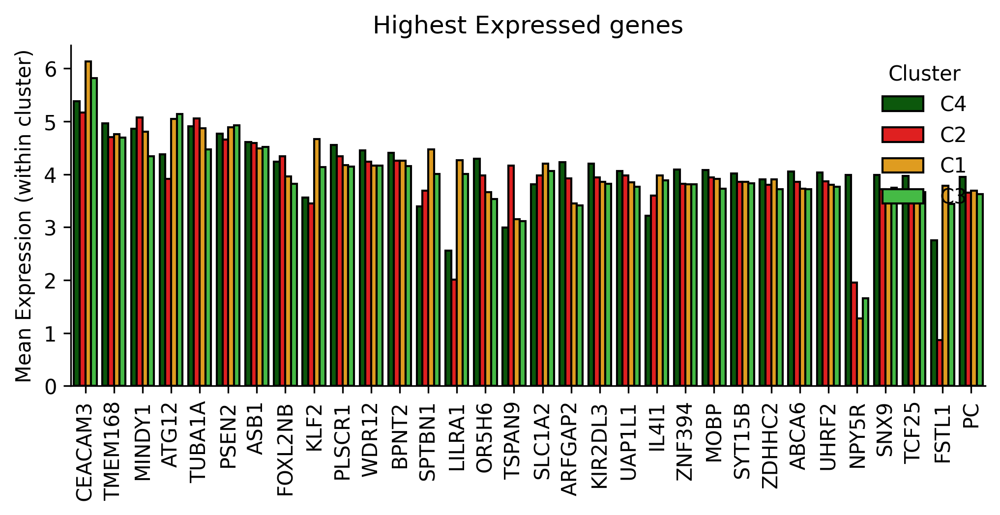

In [29]:
pdf = res.copy()
r_threshold = 25

# get the top ranked genes
top_genes = pdf[pdf['cluster_mean_rank'] < r_threshold]['gene_name'].to_list()
pdf = pdf[pdf['gene_name'].isin(top_genes)]
pdf = pdf.sort_values(by='cluster_mean_rank')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 3

sns.barplot(data=pdf, 
            x='gene_name',
            y='cluster_mean',
            hue='cluster',
            palette=colors,
            ec='k',
           )

plt.ylabel('Mean Expression (within cluster)')
plt.xlabel('')

plt.gca().tick_params(axis='x', rotation=90)
sns.move_legend(plt.gca(), 
                loc='upper right',
                title="Cluster",
                frameon=False)
plt.title("Highest Expressed genes")
sns.despine()
pdf.head()


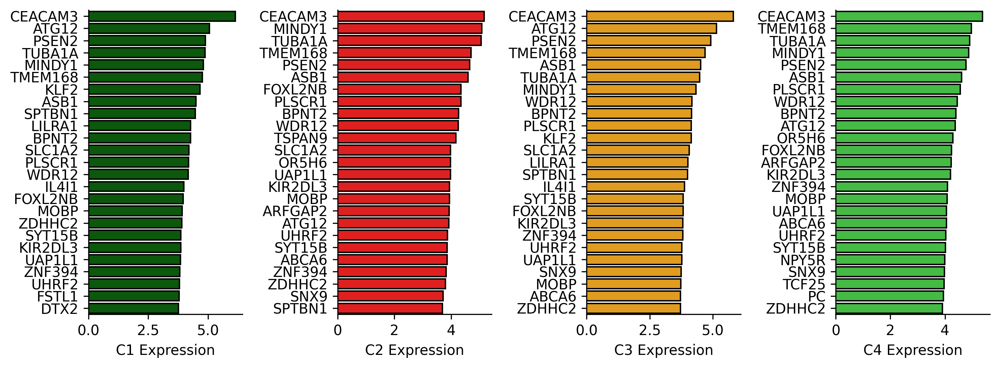

In [30]:
n = 25
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 3.75
fig, axs = plt.subplots(1, 4)

for i, (cluster, group) in enumerate(res.groupby('cluster')):

    group = group.sort_values(by='cluster_mean_rank')

    sns.barplot(data=group.head(n), 
                x='cluster_mean',
                y='gene_name',
                color=colors[i],
                ec='k',
                ax=axs[i])

    axs[i].set_ylabel("")
    axs[i].set_xlabel(f"{cluster} Expression")


plt.tight_layout()
sns.despine()

In [31]:
# # genes with the largest difference in rank

# pdf = res.copy()
# pdf = pd.pivot_table(pdf, 
#                      index='gene_name',
#                      columns='cluster',
#                      values='cluster_mean_rank').reset_index(drop=False)

# pdf['diff'] = pdf['C1'] - pdf['C2']

# pdf = pdf.sort_values(by='diff')

# edf = gget.enrichr(pdf['gene_name'].head(100).to_list(), database='ontology')
# edf.head(10)


# # pdf.head(30)

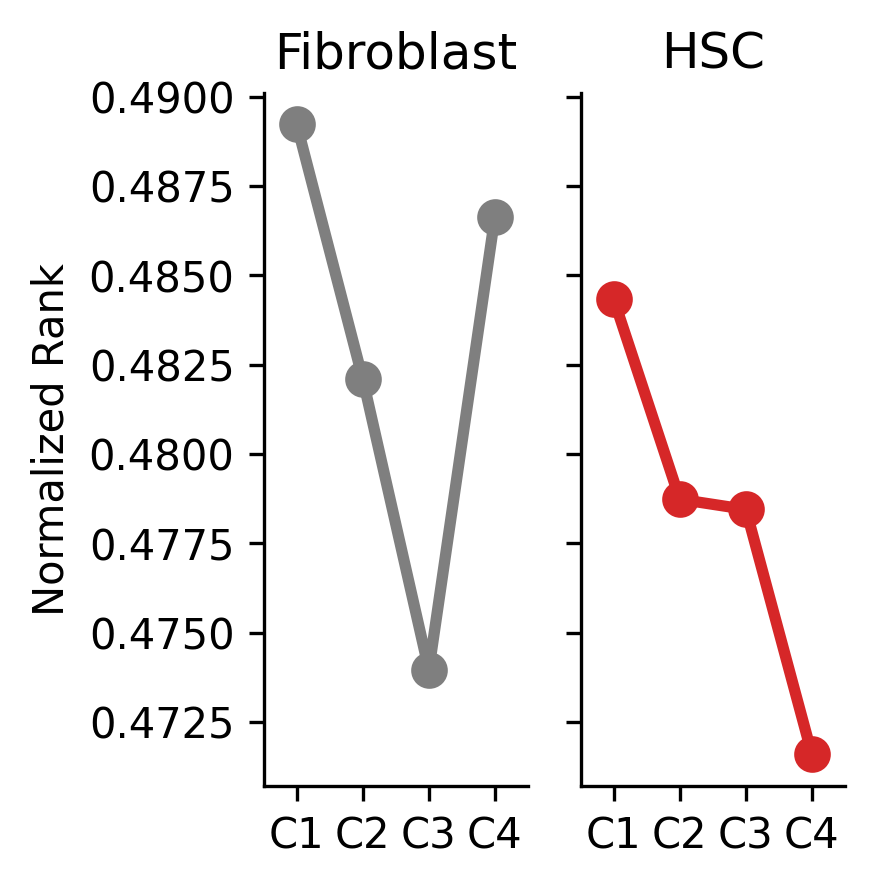

In [32]:
# what is the average rank of marker genes?
pdf = res.copy()

pdf['type'] = np.where(pdf['gene_name'].isin(fb), 'Fibroblast', 'NA')
pdf['type'] = np.where(pdf['gene_name'].isin(hp), 'HSC', pdf['type'])

# drop non-marker genes
pdf = pdf[pdf['type'] != 'NA']

marker_colors = ['C7', 'C3']


pdf = pdf.groupby(['cluster', 'type'])['cluster_mean_rank'].mean().reset_index()
pdf['cluster_mean_rank'] = pdf['cluster_mean_rank'] / res['gene_name'].nunique()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 3

fig, axs = plt.subplots(1, 2, sharey=True)

for i, (marker_type, group) in enumerate(pdf.groupby('type')):

    sns.pointplot(data=group, 
                x='cluster',
                y='cluster_mean_rank',
                hue='type',
                palette=[marker_colors[i]],
                ax=axs[i],)
                # ec='k')

    axs[i].legend().remove()
    axs[i].set_ylabel('Normalized Rank')
    axs[i].set_title(marker_type)
    axs[i].set_xlabel('')
    if not i == 0:
        axs[i].set_ylabel('')

    

sns.despine()
# # plt.yscale('log')
# plt.ylim([0.46, 0.51])
# plt.ylabel('Normalized Rank')
# plt.xlabel('')

# sns.move_legend(plt.gca(), 
#                 loc='upper right',
#                 title="Marker Genes",
#                 bbox_to_anchor=(1.2, 1.1),
#                 frameon=False)

,cluster,type,cluster_mean_rank
0,C1,Fibroblast,0.489226
1,C1,HSC,0.484328
2,C2,Fibroblast,0.482103
3,C2,HSC,0.478733
4,C3,Fibroblast,0.473962


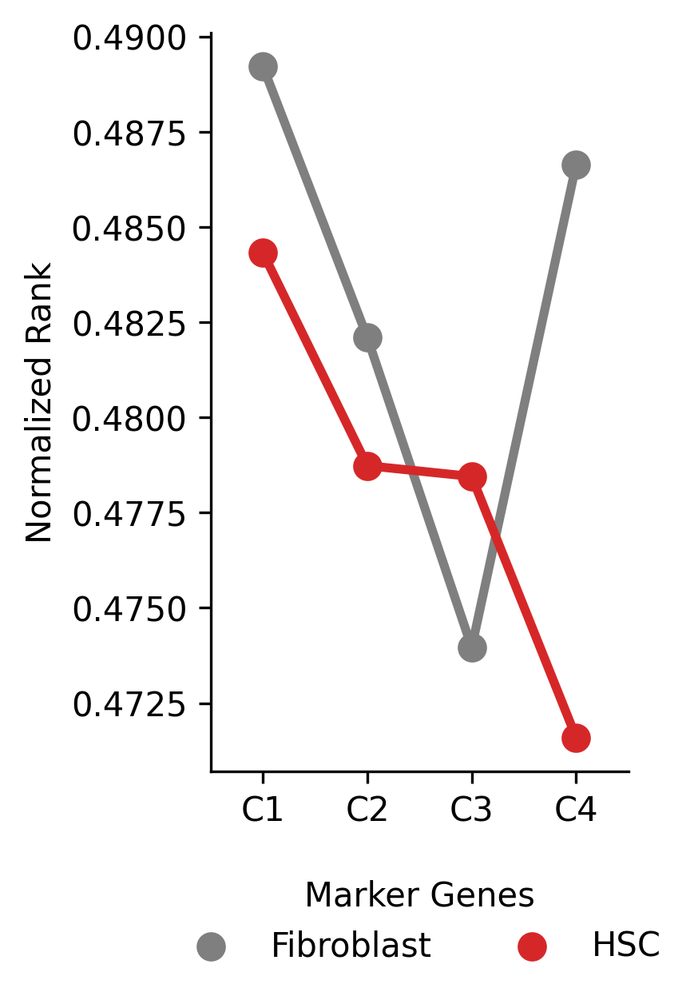

In [33]:
# what is the average rank of marker genes?
pdf = res.copy()

pdf['type'] = np.where(pdf['gene_name'].isin(fb), 'Fibroblast', 'NA')
pdf['type'] = np.where(pdf['gene_name'].isin(hp), 'HSC', pdf['type'])

# drop non-marker genes
pdf = pdf[pdf['type'] != 'NA']

marker_colors = ['C7', 'C3']


pdf = pdf.groupby(['cluster', 'type'])['cluster_mean_rank'].mean().reset_index()
pdf['cluster_mean_rank'] = pdf['cluster_mean_rank'] / res['gene_name'].nunique()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 4

sns.pointplot(data=pdf, 
              x='cluster',
              y='cluster_mean_rank',
              hue='type',
              palette=marker_colors,
              )

plt.ylabel('Normalized Rank')
plt.xlabel('')

sns.move_legend(plt.gca(), 
                loc='lower center',
                title="Marker Genes",
                ncol=2,
                bbox_to_anchor=(0.5, -0.3),
                frameon=False)

sns.despine()
pdf.head()

# Marker Plots

['ACGCACGCAGAGGCAT', 'CGCCATTAGTTGCGAG', 'TTCTTGATCTCTGCTG'] [5512, 7266, 7865]
X.shape=(8355, 192)


([], [])

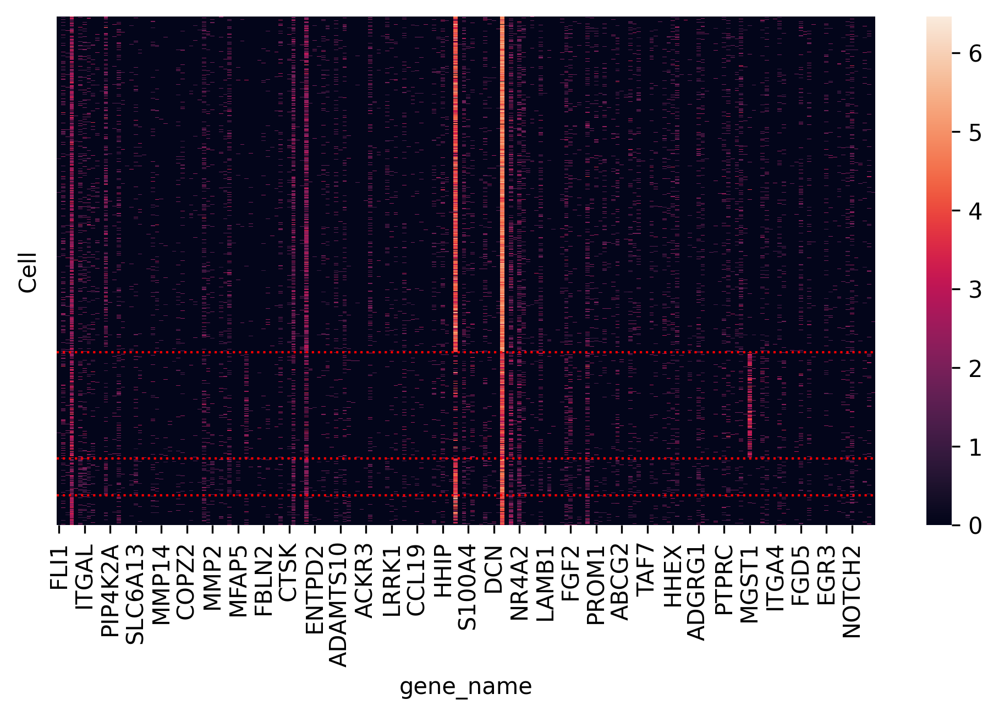

In [34]:
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# get genes, unique only
overlap = set(fb).intersection(hp)
genes = [x for x in fb + hp if not x in overlap]

gene_info = X.var.copy()
gene_info = gene_info.reset_index(drop=False)
gene_info = gene_info.set_index('gene_name')

gene_info = gene_info.reindex(genes)
gene_info = gene_info[gene_info['gene_id'].notna()]
gene_idx = gene_info['gene_id'].to_list()

X = X[cluster_idx, gene_idx]

X = X.to_df()
X.columns = gene_info.index

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 4

top = 50

print(f"{X.shape=}")


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(X, vmin=0,)

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='r', lw=1, ls=":")

plt.ylabel("Cell")
plt.yticks([])

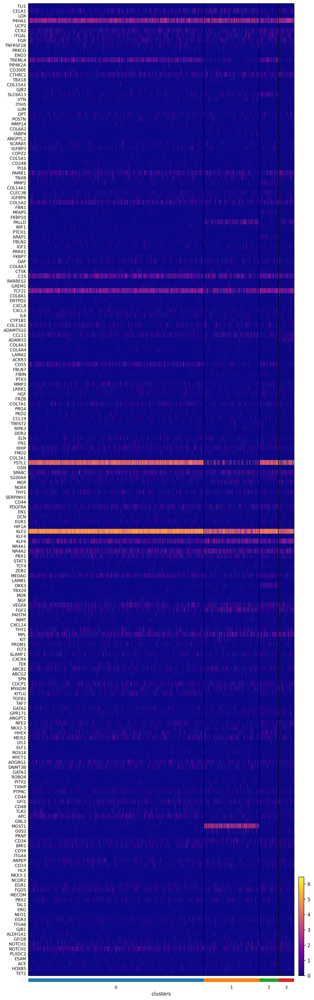

In [35]:
var_names = fb + hp
var_names = [x for x in var_names if x in adata.var['gene_name'].to_list()]

sc.pl.heatmap(adata,
              groupby='clusters',
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show_gene_labels=True,
              gene_symbols='gene_name',
              vmin=0, 
              cmap='plasma')

In [36]:
# break

# most highly expressed genes

['ACGCACGCAGAGGCAT', 'CGCCATTAGTTGCGAG', 'TTCTTGATCTCTGCTG'] [5512, 7266, 7865]
Xhat.shape=(8355, 100)


,CEACAM3,TUBA1A,PSEN2,MINDY1,ATG12,TMEM168,ASB1,KLF2,BPNT2,PLSCR1,...,ZMYND19,PBX4,SMIM19,EDNRB,DEFB104A,UBE2S,C6,OXSR1,NDUFV2,P2RY2
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,6.319385,4.927746,4.568004,4.362757,5.191758,4.789070,4.628018,4.283776,4.104208,4.198017,...,2.558695,2.558695,2.558695,3.604325,1.940104,1.940104,3.212371,2.558695,2.558695,3.212371
GGCGTCACAGAGTCTT,6.132099,4.090348,5.441122,4.519742,5.264283,5.082996,4.819178,3.647879,4.459798,4.519742,...,2.834720,2.834720,3.498060,3.107610,3.107610,3.778150,2.458200,3.321772,2.834720,3.321772
GGCGTCACAATAACGA,6.193961,5.343928,4.797379,5.032029,5.452633,4.576296,3.715134,4.861401,4.396031,3.498060,...,0.000000,2.834720,2.834720,3.220413,2.198648,2.198648,0.000000,3.498060,0.000000,2.834720
GGCGTCAAGGTAGTAT,6.302825,5.060324,4.553719,4.977494,6.219104,4.887178,4.677642,4.977494,4.412236,4.333204,...,0.000000,0.000000,1.983160,4.049887,3.260504,4.049887,2.985530,3.260504,1.983160,3.260504
GGCGTCAAGCGTTCAT,6.225517,5.417057,5.511963,4.822846,5.062283,4.909187,5.195023,3.825223,5.062283,4.507404,...,3.825223,0.000000,2.502318,4.043995,3.544786,0.000000,0.000000,2.502318,3.153656,3.153656


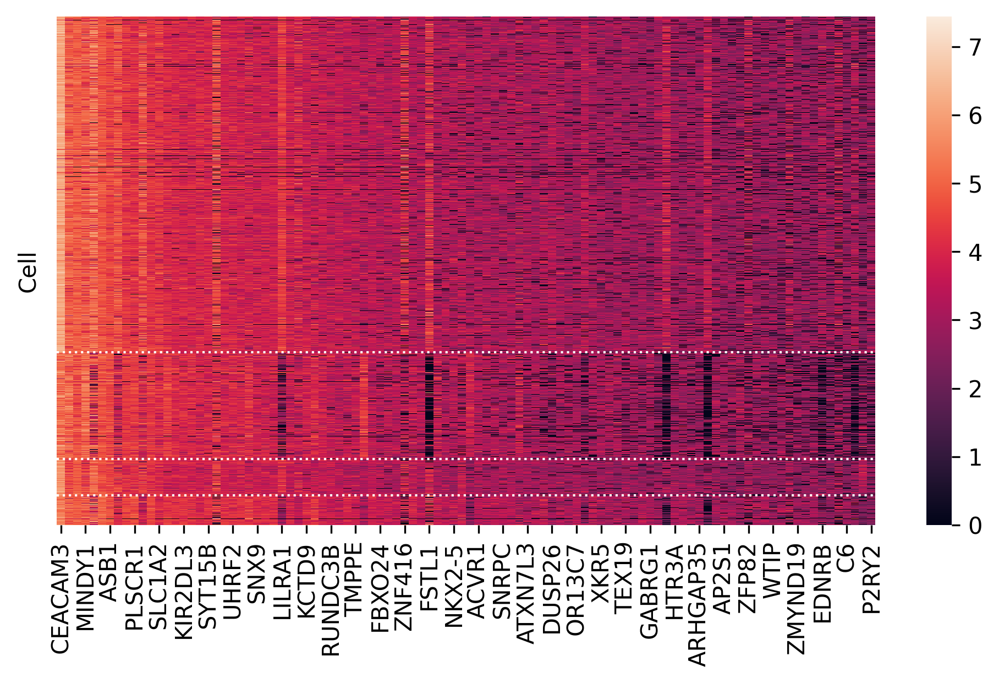

In [37]:
top_genes = 100
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# sort by cluster
X = X[cluster_idx, :]

X = X.to_df()

# compute entropy
colsum = X.sum(axis=0)

edf = pd.DataFrame(colsum, columns=['expression'])
edf['gene_id'] = X.columns
edf['gene_name'] = edf['gene_id'].map(id2name)

edf = edf.sort_values(by='expression', ascending=False)


# subset the data
Xhat = X[edf['gene_id'].head(top_genes).to_list()]
Xhat.columns = edf['gene_name'].head(top_genes).to_list()

print(f"{Xhat.shape=}")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(Xhat, vmin=0,)
plt.ylabel("Cell")
plt.yticks([])

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='w', lw=1, ls=":")

Xhat.head()

# most entropic genes

['ACGCACGCAGAGGCAT', 'CGCCATTAGTTGCGAG', 'TTCTTGATCTCTGCTG'] [5512, 7266, 7865]
Xhat.shape=(8355, 2000)


,CEACAM3,PSEN2,TMEM168,ASB1,TUBA1A,WDR12,MINDY1,BPNT2,PLSCR1,FOXL2NB,...,CHST10,CTDSP1,TAS2R16,CRYL1,OR14J1,PLA2G4B,LENEP,POU6F1,SLC24A1,NUCKS1
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGGTTACCT,0.000129,0.000113,0.000121,0.000123,0.000121,0.000135,0.000108,0.000115,0.000119,0.000133,...,0.000000,0.0,0.000000,0.000000,0.000000,0.00113,0.0,0.0,0.0,0.001166
GGCGTCACAGAGTCTT,0.000125,0.000135,0.000128,0.000128,0.000100,0.000117,0.000112,0.000125,0.000128,0.000112,...,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
GGCGTCACAATAACGA,0.000127,0.000119,0.000115,0.000098,0.000131,0.000115,0.000125,0.000124,0.000099,0.000127,...,0.000000,0.0,0.001294,0.000000,0.001312,0.00000,0.0,0.0,0.0,0.000000
GGCGTCAAGGTAGTAT,0.000129,0.000113,0.000123,0.000124,0.000124,0.000104,0.000123,0.000124,0.000123,0.000120,...,0.001168,0.0,0.000000,0.001085,0.000000,0.00000,0.0,0.0,0.0,0.000000
GGCGTCAAGCGTTCAT,0.000127,0.000137,0.000124,0.000138,0.000133,0.000132,0.000119,0.000142,0.000128,0.000133,...,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000


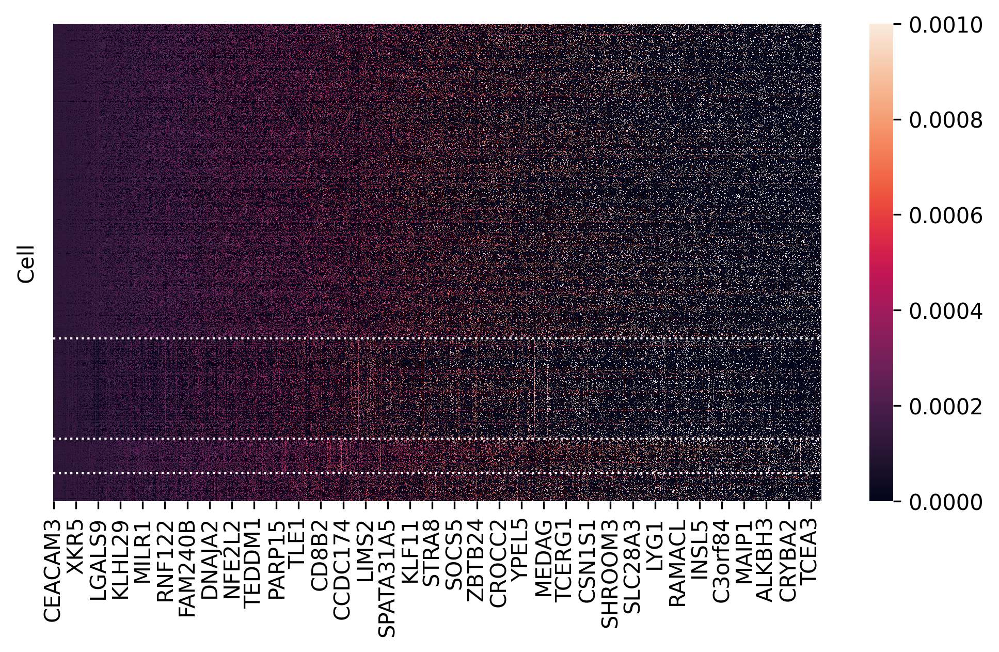

In [38]:
top_genes = 2000
X = adata.copy()

# sort by cluster
clusters = X.obs.sort_values(by='clusters')
cluster_idx = clusters.index

# get the dividing line
cluster_boundary = clusters[clusters['clusters'].shift() != clusters['clusters']].index.to_list()[1:]
cluster_boundary_idx = [clusters.index.to_list().index(x) for x in cluster_boundary]

print(cluster_boundary, cluster_boundary_idx)

# sort by cluster
X = X[cluster_idx, :]

X = X.to_df()

# compute entropy
colsum = X.sum(axis=0)
X = X.divide(colsum)
entropy = scipy.stats.entropy(X, axis=0)

edf = pd.DataFrame(entropy, columns=['entropy'])
edf['gene_id'] = X.columns
edf['gene_name'] = edf['gene_id'].map(id2name)

edf = edf.sort_values(by='entropy', ascending=False)


# subset the data
Xhat = X[edf['gene_id'].head(top_genes).to_list()]
Xhat.columns = edf['gene_name'].head(top_genes).to_list()

print(f"{Xhat.shape=}")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 4

sns.heatmap(Xhat, vmin=0, vmax=0.001)
plt.ylabel("Cell")
plt.yticks([])

for c_idx in cluster_boundary_idx:
    plt.axhline(y=c_idx, c='w', lw=1, ls=":")

Xhat.head()

# differential expression analysis

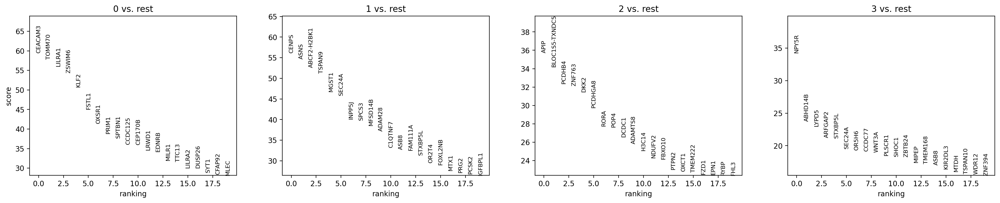

,group,names,scores,logfoldchanges,pvals,pvals_adj,gene_name
0,0,ENSG00000170956,59.474686,1.144207,0.0,0.0,CEACAM3
1,0,ENSG00000154174,57.809116,3.548203,0.0,0.0,TOMM70
2,0,ENSG00000104974,56.006931,2.612720,0.0,0.0,LILRA1
3,0,ENSG00000130449,54.366810,3.245156,0.0,0.0,ZSWIM6
4,0,ENSG00000127528,50.753704,1.545015,0.0,0.0,KLF2


In [39]:
sc.tl.rank_genes_groups(adata, 'clusters', method='wilcoxon')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 4
sc.pl.rank_genes_groups(adata, 
                        n_genes=20, 
                        sharey=False, 
                        gene_symbols='gene_name')

deg = sc.get.rank_genes_groups_df(adata, 
                                  gene_symbols='gene_name',
                                  group=None)

deg.head()

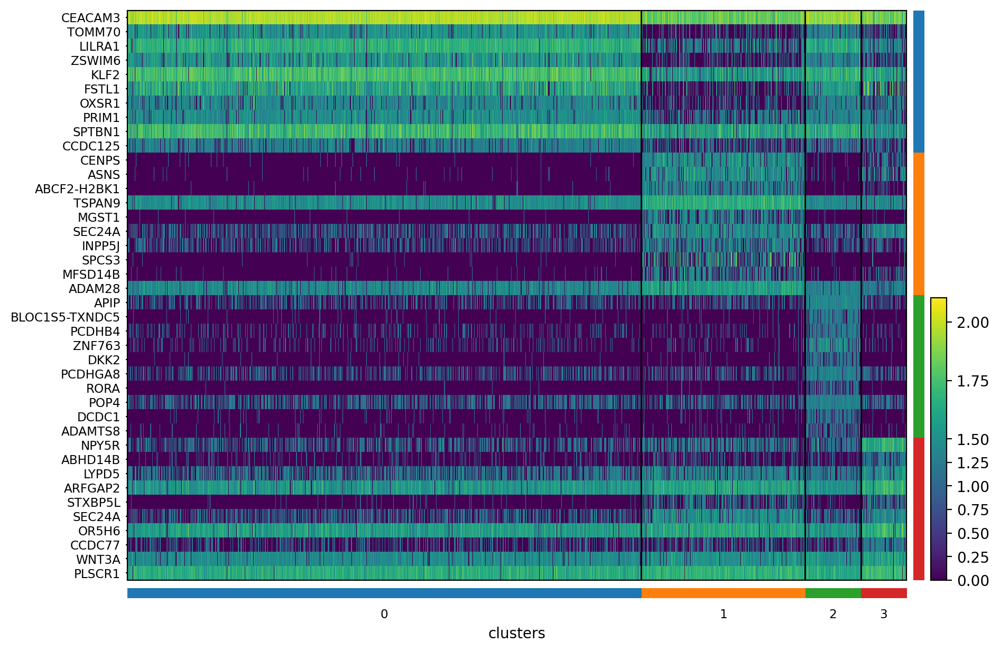

In [40]:
sc.pl.rank_genes_groups_heatmap(adata, 
                                n_genes=10, 
                                use_raw=False, 
                                dendrogram=False,
                                log=True,
                                groupby='clusters',
                                swap_axes=True, 
                                show_gene_labels=True,
                                vcenter=1.5,
                                gene_symbols='gene_name',
                                cmap='viridis')

# Cell type predictions

In [41]:
alpha = 0.05
n_query = 10
lfc_threshold = 0.0

for cluster, group in deg.groupby('group'):
    group = group[group['pvals_adj'] <= alpha]
    group = group[group['logfoldchanges'] > lfc_threshold]
    group = group.sort_values(by='logfoldchanges', ascending=False)
    group = group.head(n_query)

    gene_list = group['gene_name'].to_list()
    edf = gget.enrichr(gene_list, database='celltypes')
    print(edf.head())
    pass
    

Wed Jan  3 08:51:27 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Wed Jan  3 08:51:27 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank                                path_name     p_val    z_score  \
0     1                          Granulosa Cells  0.001358  45.181818   
1     2         Cardiac Stem And Precursor Cells  0.001382  44.772523   
2     3  Endothelial Cells (Blood Brain Barrier)  0.001382  44.772523   
3     4                          Satellite Cells  0.002081  36.228102   
4     5                      Loop Of Henle Cells  0.002323  34.215517   

   combined_score overlapping_genes  adj_p_val                  database  
0      298.272358    [NUAK1, FSTL1]   0.030410  PanglaoDB_Augmented_2021  
1      294.782763    [NUAK1, FSTL1]   0.030410  PanglaoDB_Augmented_2021  
2      294.782763  [NUAK1, CEP170B]   0.030410  PanglaoDB_Augmented_2021  
3      223.712354    [NUAK1, FSTL1]   0.030663  PanglaoDB_Augmented_2021  
4      207.514658     [MAOB, FSTL1]   0.030663  PanglaoDB_Augmented_2021  


Wed Jan  3 08:51:27 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank                    path_name     p_val    z_score  combined_score  \
0     1                    Ionocytes  0.052241  20.842767       61.525339   
1     2               Parietal Cells  0.054146  20.080808       58.557126   
2     3  Pancreatic Progenitor Cells  0.055572  19.544739       56.485817   
3     4          Airway Goblet Cells  0.057470  18.872745       53.909756   
4     5     Hematopoietic Stem Cells  0.085537  12.437539       30.581495   

  overlapping_genes  adj_p_val                  database  
0         [ARFGEF3]   0.100573  PanglaoDB_Augmented_2021  
1         [ARFGEF3]   0.100573  PanglaoDB_Augmented_2021  
2         [ARFGEF3]   0.100573  PanglaoDB_Augmented_2021  
3          [GOLPH3]   0.100573  PanglaoDB_Augmented_2021  
4           [MGST1]   0.101945  PanglaoDB_Augmented_2021  


Wed Jan  3 08:51:27 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might be a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    


   rank               path_name     p_val    z_score  combined_score  \
0     1                 T Cells  0.002915  30.409509      177.529445   
1     2  Enterochromaffin Cells  0.053194  20.454733       60.010268   
2     3                Nuocytes  0.053670  20.266055       59.276185   
3     4  Natural Killer T Cells  0.057470  18.872745       53.909756   
4     5            Luteal Cells  0.060784  17.801075       49.850583   

  overlapping_genes  adj_p_val                  database  
0     [RORA, CYTL1]   0.032063  PanglaoDB_Augmented_2021  
1           [LMX1A]   0.098449  PanglaoDB_Augmented_2021  
2            [RORA]   0.098449  PanglaoDB_Augmented_2021  
3            [RORA]   0.098449  PanglaoDB_Augmented_2021  
4            [RORA]   0.098449  PanglaoDB_Augmented_2021  
   rank                               path_name     p_val    z_score  \
0     1                             Fibroblasts  0.005670  21.478261   
1     2  Pulmonary Vascular Smooth Muscle Cells  0.048422  22.553288 

In [42]:
group.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj,gene_name
41753,3,ENSG00000122566,4.246095,4.203208,2.175286e-05,6.764453e-04,HNRNPA2B1
41472,3,ENSG00000128923,11.363917,4.168774,6.324343e-30,1.212781e-27,MINDY2
41421,3,ENSG00000164129,34.257641,4.012930,3.356305e-257,4.634051e-253,NPY5R
41493,3,ENSG00000170802,10.199712,3.927484,1.988613e-24,2.665707e-22,FOXN2
41454,3,ENSG00000212807,13.099199,3.906928,3.327509e-39,9.775088e-37,OR2A42


edf.shape=(4571, 8)


,group,type,rank,cluster
0,0,Fibroblast,0.198010,C1
1,0,HSC,0.347382,C1
3,1,Fibroblast,0.425680,C2
4,1,HSC,0.305662,C2
6,2,Fibroblast,0.310904,C3


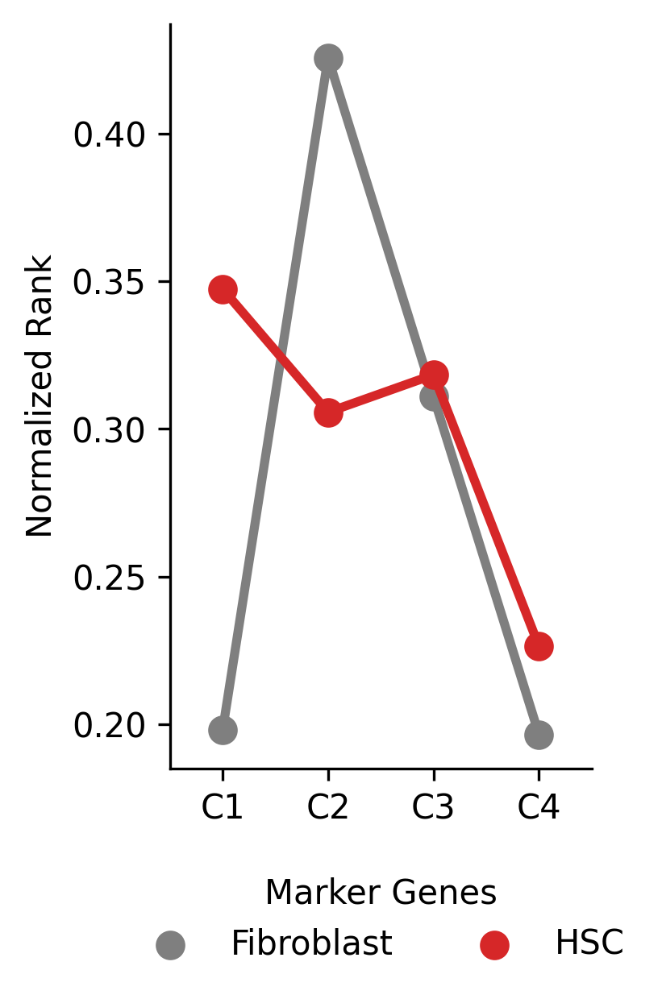

In [43]:
edf = deg.copy()
ubiquity_threshold = 0.1
alpha = 0.05

edf['type'] = np.where(edf['gene_name'].isin(fb), 'Fibroblast', 'NA')
edf['type'] = np.where(edf['gene_name'].isin(hp), 'HSC', edf['type'])

edf = edf[(edf['pvals_adj'] < alpha)]

# unbiquity thresholding
print(f"{edf.shape=}")

genes = edf['names'].to_list()
perc_expressing = adata[:, genes].X.astype(bool).astype(int)
perc_expressing = perc_expressing.sum(axis=0)
edf['perc_expressing'] = perc_expressing / len(adata)
edf = edf[edf['perc_expressing'] > ubiquity_threshold]


# rank genes within group
edf['rank'] = edf.groupby('group')['logfoldchanges'].transform('rank', ascending=False)

n_genes = edf['gene_name'].nunique()

# get the average rank
edf = edf.groupby(['group', 'type'])['rank'].mean().reset_index()
edf = edf[edf['type'] != 'NA']
edf['cluster'] = edf['group'].apply(lambda x: f"C{int(x)+1}")

# normalize the rank
edf['rank'] = edf['rank'] / n_genes


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 4

sns.pointplot(data=edf, 
              x='cluster',
              y='rank',
              hue='type',
              palette=marker_colors,
              )

plt.ylabel('Normalized Rank')
plt.xlabel('')

sns.move_legend(plt.gca(), 
                loc='lower center',
                title="Marker Genes",
                ncol=2,
                bbox_to_anchor=(0.5, -0.3),
                frameon=False)

sns.despine()

plt.gca().set_facecolor('None')
plt.gca().set_alpha(0.0)

edf.head()

In [44]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
top = 7
alpha = 0.01
ubiquity_threshold = 0.05
ubiquity_threshold_upper = 0.75
edf = deg.copy()

# set the colors for the bars underneath (STUPID)
adata.uns['clusters_colors'] = colors 

edf = edf[(edf['pvals_adj'] < alpha)]

# unbiquity thresholding
print(f"{edf.shape=}")

genes = edf['names'].to_list()
perc_expressing = adata[:, genes].X.astype(bool).astype(int)
perc_expressing = perc_expressing.sum(axis=0)
edf['perc_expressing'] = perc_expressing / len(adata)
edf = edf[edf['perc_expressing'] > ubiquity_threshold]
edf = edf[edf['perc_expressing'] < ubiquity_threshold_upper]

# sorting and subsetting the top genes
edf = edf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])
edf = edf.groupby('group').head(top)

edf['type'] = np.where(edf['gene_name'].isin(fb), 'Fibroblast', 'NA')
edf['type'] = np.where(edf['gene_name'].isin(hp), 'HSC', edf['type'])

var_names = edf['gene_name'].to_list()

plt.rcParams['figure.dpi'] = 200

ax = sc.pl.heatmap(adata,
              groupby='clusters',
              figsize=(5, 5.5),
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show=False,
              # standard_scale=True,
              show_gene_labels=True,
              gene_symbols='gene_name',
              cmap='viridis')

ax['heatmap_ax'].axhline(y=top-0.5, c='k')
ax['heatmap_ax'].axhline(y=(2*top)-0.5, c='k')
ax['heatmap_ax'].axhline(y=(3*top)-0.5, c='k')
edf

# HSC pathways

In [ ]:
dpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/GO_annotations/"

hdf = []

for f in os.listdir(dpath):
    fpath = f"{dpath}{f}"
    tmp = pd.read_csv(fpath, sep='\t')
    hdf.append(tmp)

hdf = pd.concat(hdf)
hdf.head()

In [ ]:
var_names = list(hdf['SYMBOL'].unique())
var_names = [x for x in var_names if x in adata.var['gene_name'].to_list()]

ax = sc.pl.heatmap(adata,
              groupby='clusters',
              figsize=(4, 15),
              use_raw=False, 
              var_names=var_names,
              swap_axes=True, 
              show=False,
              standard_scale=True,
              show_gene_labels=True,
              gene_symbols='gene_name',
              cmap='viridis')

# Write the Data

In [ ]:
outpath = "/scratch/indikar_root/indikar1/cstansbu/all_scHSC_run4/scanpy/anndata_distance.h5ad"
adata.write(outpath)
print('done')

In [ ]:
break

In [ ]:
# hdf.head()

In [ ]:
# # enrichments for each cluster

# alpha = 0.05
# fc_threshold = 0.0
# n_query = 10

# # db = 'ontology'
# # db = 'TRRUST_Transcription_Factors_2019'
# db = 'PanglaoDB_Augmented_2021'

# for cluster, group in deg.groupby('group'):

#     group = group[group['pvals_adj'] < alpha]
#     group = group[group['logfoldchanges'].abs() > fc_threshold]
#     group = group.reset_index(drop=True)

#     group = group.sort_values(by='logfoldchanges', ascending=False)
#     group = group.head(n_query)

#     gene_names = adata.var.loc[group['names'].to_list()]['gene_name'].to_list()
#     print(gene_names)
    
#     # edf = gget.enrichr(gene_names, database=db)
#     # print(edf[['path_name', 'adj_p_val', 'overlapping_genes']].head(10))
    
#     # print()

In [ ]:
# edf = gget.enrichr(gene_names, database=db)

In [ ]:
break

# Pathway analysis

In [ ]:
def parseKEGG(pathId):
    genes = []
    results = REST.kegg_get(pathId).read()
    current_section = None
    for line in results.rstrip().split("\n"):
        section = line[:12].strip()  # section names are within 12 columns
        if not section == "":
            current_section = section

        if current_section == "GENE":
            linesplit = line[12:].split("; ")
            gene_identifiers = linesplit[0]
            gene_id, gene_symbol = gene_identifiers.split()
    
            if not gene_symbol in genes:
                genes.append(gene_symbol)
    return genes

def getPathname(pathId):
    """A function to return the legg pathname"""
    result = REST.kegg_list(pathId).read()
    return result.split("\t")[1].split("-")[0].strip()


pid = "04110"
pgenes = parseKEGG(f"hsa{pid}")
pname = getPathname(f"hsa{pid}")
print(pname)
print(pgenes)

In [ ]:
pids = [
    "04110", 
    "03022", 
    "03020",
    "04310",
    "04330",
    "04115",
    "04218",
    "04810",
    "04710",
    "04713",
]

exp_genes = adata.var['gene_name'].to_list()

pways = {}

for pid in pids:
    pgenes = parseKEGG(f"hsa{pid}")
    pname = getPathname(f"hsa{pid}")
    gene_list = [x for x in pgenes if x in exp_genes]
    print(f"{pname} ({pid}) has {len(pgenes)} genes, {len(gene_list)} expressed")
    pways[pname] = gene_list

print('done')

In [ ]:
for pathway, gene_list in pways.items():
    gene_ids = adata.var[adata.var['gene_name'].isin(gene_list)].index
    adata.obs[f"{pathway}_mean"] = adata[:, gene_ids].X.mean(axis=1)
    adata.obs[f"{pathway}_median"] = np.median(adata[:, gene_ids].X, axis=1)
    adata.obs[f"{pathway}_max"] = adata[:, gene_ids].X.max(axis=1)
    
print('done')

In [ ]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 15, 7

pdf = adata.obs.copy()
fig, axs = plt.subplots(2, 5)
axs = axs.ravel()

for i, pathway in enumerate(pways.keys()):
    column_name = f"{pathway}_max"

    # sort order
    order = np.argsort(pdf[column_name])

    sns.scatterplot(data=pdf.iloc[order], 
                    x='UMAP 1',
                    y='UMAP 2',
                    hue=column_name,
                    palette=cmap,
                    alpha=0.9,
                    ax=axs[i],
                    s=5,
                    # hue_norm=(0, 0.2),
                    ec='none')

    axs[i].set_yticks([])
    axs[i].set_xticks([])
    axs[i].legend().remove()
    axs[i].set_title(pathway)

sns.despine()
plt.tight_layout()

# Write data

In [ ]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/single-cell/nov2023_run1/scanpy/anndata_processed.h5ad"
adata.write(outpath)

print('done')

# Some calulcations from flow

In [ ]:
simul = [97.1, 96.3, 97.0]
print(np.mean(simul))
print(np.std(simul))

serial = [84.1, 87.2, 85.2]
print(np.mean(serial))
print(np.std(serial))

both = [84.1, 87.2, 85.2]
print(np.mean(serial))
print(np.std(serial))



In [ ]:

recipe = ['FH3', 'FH3', 'FH6', 'FH6',  'FH7',  'FH7', 'FH8', 'FH8',]
mois = ['Low', 'High'] * 4
CD34 = [1.17, 2.08, 3.33, 1.70, 2.73, 2.09, 3.39, 1.86]

df = pd.DataFrame({
     'Recipe' : recipe,
     'MOI' : mois,
})

df

In [ ]:
gx = df.groupby([''])

In [ ]:

recipe = ['FH3', 'FH3', 'FH6', 'FH6',  'FH7',  'FH7', 'FH8', 'FH8',]
mois = ['Low', 'High'] * 4
CD34 = [1.17, 2.08, 3.33, 1.70, 2.73, 2.09, 3.39, 1.86]

df = pd.DataFrame({
     'Recipe' : recipe,
     'MOI' : mois,
})

df